# Analisis Exploratorios

## Librerias

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Funciones

In [2]:
def categorizar(df):
    var_numericas = df.columns[3:]
    df = df.replace( {'Error 3000': np.nan, '<NA>': np.nan} )
    df = df.convert_dtypes()
    
    return df

def filtrar_por_iqr(df, var):
    Q1 = df[var].quantile(0.25)
    Q3 = df[var].quantile(0.75)
    IQR = Q3 - Q1
    filtro = (df[var] >= (Q1 - 1.5 * IQR)) & (df[var] <= (Q3 + 1.5 * IQR))
    return df[filtro]

def rev_var(df, param):
    
    f = plt.figure(figsize=(25,9))
    gs = f.add_gridspec(2,2)

    ax0 = f.add_subplot(gs[0,:])
    ax0.set(xlabel = 'Fecha', ylabel = 'Valor del parametro' )

    ax1 = f.add_subplot(gs[1,0])
    ax1.set(xlabel = 'Valor del parametro', ylabel = 'Conteos' )

    ax2 = f.add_subplot(gs[1,1]) 
    ax2.set(xlabel = 'Tipo de producto', ylabel = 'Valor del parametro' )

    with sns.axes_style('darkgrid'):    
        sns.lineplot(data=df, 
                     x = 'Start Time', 
                     y=param, 
                     hue = 'Sortname', 
                     ax = ax0)

        
        sns.histplot(data=df, 
                     x = param, 
                     hue='Sortname',                     
                     ax = ax1
                     )
        
        sns.boxplot(data=df, 
                    x='Sortname', 
                    y = param,
                    ax = ax2 
                    )
        
    f.suptitle(param)

    f.tight_layout()
    f
    
def plot_correlation(df):
    df_corr = df.corr()
    mask = np.zeros_like(df_corr)
    mask[np.triu_indices_from(mask)] = True
    plt.figure(figsize= (15,15))
    cmap = sns.diverging_palette(220, 10, as_cmap=True)
    g = sns.heatmap( 
                     df_corr,
                     mask=mask,
                     vmax=1, vmin=-1,
                     cmap=cmap, center=0, square=True, linewidths=.5
                    );
    return g .

def list_corr(df, var_obj, n):
    df_corr = df.corr()
    var_relevantes = abs(df_corr[var_obj]).sort_values(ascending = False)[1:n]  
    return var_relevantes  

In [3]:
path = '/content/CemQ_Predicts/data/data_raw.xlsx'

sortnames = [ 'BOYT1',                  
              'ESP2',    
              'ESP',
              'ESP+',      
              'CTO.REACT',                         
              'ECOART',
              'ART.F',       
              'BASE1.BOYT1.MS',    
              'BASE2.BOYT1.MS',
              'BOYT1.MS'                  
              ]

df= pd.read_excel(path',
                  sheet_name='quimicos', 
                  engine='openpyxl')[1:]
df.drop('CaO.Cto_AVG', axis=1, inplace = True)

df = categorizar(df)
df = df[df['Sortname'].isin(sortnames)]
df = df[ ( df['Location'] == 'NO.561.d' ) | ( df['Location'] == 'NO.562.d' ) | ( df['Location'] == 'NO.563.d' ) | ( df['Location'] == 'NO.630.d' ) ]
df = df.drop(columns=['NO.BLAINE_AVG','R38_AVG']).dropna()

features = df.columns[3:]

for var in features:
    df = filtrar_por_iqr(df, var)
    
df.head()

,Start Time,Sortname,Location,CaO_AVG,SiO2_AVG,Al2O3_AVG,Fe2O3_AVG,MgO_AVG,NO.SO3.P_AVG,LOI.P_AVG,...,NO.R45_AVG,WC_AVG,WR_AVG,SETINI_AVG,SETFIN_AVG,FLOW_AVG,NO.1CSA_AVG,NO.3CSA_AVG,NO.7CSA_AVG,NO.28CSA_AVG
33,2019-01-02,BOYT1,NO.630.d,52.406399,25.0984,5.0146,2.7556,0.6735,2.3595,9.72,...,12.33,52.029999,24.92,181,260,109.0,6.1,14.52,19.780001,28.309999
171,2019-01-05,BOYT1,NO.563.d,52.431499,24.811501,5.233,2.8548,0.6637,2.3451,9.71,...,11.86,51.889999,24.77,177,270,111.0,4.96,14.04,18.67,26.33
174,2019-01-05,ESP+,NO.630.d,60.783199,23.4116,5.3005,3.2836,0.8082,2.6497,1.96,...,1.16,48.919998,24.92,128,175,108.0,15.92,30.33,39.880001,45.209999
231,2019-01-06,BOYT1,NO.563.d,52.664001,25.6136,5.0334,2.9018,0.7016,2.3768,9.33,...,12.43,52.029999,24.15,159,252,106.0,6.61,14.78,19.879999,28.18
234,2019-01-06,ESP2,NO.563.d,59.214901,23.465599,5.1661,3.2947,0.7415,2.3205,4.0,...,1.01,48.650002,25.690001,128,201,113.0,14.67,30.15,37.330002,48.389999


# Visualizaciones

## Datos nulos

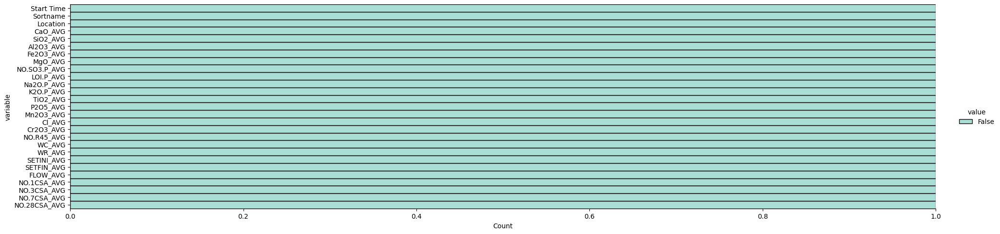

In [4]:
(
    df
    .isnull()
    .melt()
    .pipe(
        lambda df: (
            sns.displot(
                data = df,
                y = 'variable',
                hue = 'value',
                multiple = 'fill',
                aspect = 4,
                palette = 'Set3'
            )
        )
    )
)

In [5]:
df.shape

(1555, 27)

## Datos por lacalización

In [6]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

var_numericas = df.columns[3:]
df.groupby(['Location'])[var_numericas].count().T

Location,NO.561.d,NO.562.d,NO.563.d,NO.630.d
CaO_AVG,492,6,536,521
SiO2_AVG,492,6,536,521
Al2O3_AVG,492,6,536,521
Fe2O3_AVG,492,6,536,521
MgO_AVG,492,6,536,521
NO.SO3.P_AVG,492,6,536,521
LOI.P_AVG,492,6,536,521
Na2O.P_AVG,492,6,536,521
K2O.P_AVG,492,6,536,521
TiO2_AVG,492,6,536,521


In [7]:
df.groupby(['Location', 'Sortname']).describe()

CaO_AVG                                             \
                    count       mean       std        min        25%   
Location Sortname                                                      
NO.561.d ART.F      135.0  57.324133  2.666412  44.244301  56.639499   
         BOYT1       25.0    53.8908  5.833178  44.539001  50.339199   
         BOYT1.MS     6.0  48.692567  4.600997    44.3433  46.732077   
         ESP+       208.0   58.50357  5.888016    36.0443  57.780949   
         ESP2       118.0  57.466741  5.752477    42.4547   55.12005   
NO.562.d ART.F        2.0  58.915551  0.177839  58.789799  58.852675   
         BOYT1        2.0  55.651849  0.086336  55.590801  55.621325   
         ESP+           1    66.8573      <NA>    66.8573    66.8573   
         ESP2           1  65.863503      <NA>  65.863503  65.863503   
NO.563.d ART.F        2.0   59.75565  0.550906    59.3661  59.560875   
         BOYT1      289.0  51.798623  6.321586    36.0443     48.202   
         BOYT1.MS   152.0  46.526766  1.446875  43.807899  45.922676   
         ESP+        25.0   61.36136  1.500722  57.017601     61.077   
         ESP2        68.0  58.830375  3.664273     44.222  58.247975   
NO.630.d ART.F       44.0  56.811805  4.141652  43.784901  56.267425   
         BOYT1      144.0  50.035231  5.730223  44.196999  46.644825   
         ESP+       211.0  59.287792  4.432678  44.110001    59.1957   
         ESP2       122.0  58.399308  4.932895  42.004902    57.2431   

                                                   SiO2_AVG             \
                         50%        75%        max    count       mean   
Location Sortname                                                        
NO.561.d ART.F     57.254101  57.689351  67.380699    135.0   27.01001   
         BOYT1       51.7919  55.429501  66.898697     25.0  26.486948   
         BOYT1.MS    47.4314  48.503624  57.589298      6.0  31.109884   
         ESP+      59.486851  60.521324  68.788002    208.0  24.596001   
         ESP2      57.042601  59.814224  68.055298    118.0   26.37404   
NO.562.d ART.F     58.915551  58.978426  59.041302      2.0  27.397201   
         BOYT1     55.651849  55.682374  55.712898      2.0    25.4553   
         ESP+        66.8573    66.8573    66.8573        1    25.7453   
         ESP2      65.863503  65.863503  65.863503        1    26.2181   
NO.563.d ART.F      59.75565  59.950424  60.145199      2.0   26.32855   
         BOYT1     50.307098  52.403099  67.872299    289.0  29.929297   
         BOYT1.MS  46.360899  47.097199  57.750801    152.0  31.836148   
         ESP+         61.431  61.628799  65.612701     25.0   23.44256   
         ESP2      59.210301    60.1514  66.886101     68.0  24.549193   
NO.630.d ART.F     57.123699  58.083601  67.481903     44.0   26.89417   
         BOYT1      48.10075  50.562374  68.055298    144.0  30.462431   
         ESP+        60.2326  61.285648  68.430603    211.0  24.074809   
         ESP2         58.841  59.782001  68.788002    122.0  25.347545   

                                                                         \
                        std        min        25%        50%        75%   
Location Sortname                                                         
NO.561.d ART.F     1.367871    23.4897  26.292701    26.5774   27.24325   
         BOYT1     1.755161  24.295401  25.394199  26.600201  26.885599   
         BOYT1.MS  3.178714  26.238001     30.228   30.68705  32.611674   
         ESP+      1.031686     22.399  24.043125   24.52055  25.027074   
         ESP2      1.978322    22.1775   25.56525    26.7091  27.721576   
NO.562.d ART.F     0.663691    26.9279   27.16255  27.397201  27.631851   
         BOYT1     0.304904    25.2397    25.3475    25.4553    25.5631   
         ESP+          <NA>    25.7453    25.7453    25.7453    25.7453   
         ESP2          <NA>    26.2181    26.2181    26.2181    26.2181   
NO.563.d ART.F     0.202728    26.1852  26.256875 

## Sortname

In [8]:
df.groupby(['Sortname']).describe()

CaO_AVG                                                        \
           count       mean       std        min        25%        50%   
Sortname                                                                 
ART.F      183.0  57.244917  3.072319  43.784901  56.597049  57.254101   
BOYT1      460.0  51.377063  6.179317  36.044300  47.380226  49.674051   
BOYT1.MS   158.0  46.609012  1.691176  43.807899  45.928077  46.367451   
ESP+       445.0  59.054737  5.116929  36.044300  58.612598  59.948200   
ESP2       309.0  58.162201  5.054635  42.004902  56.146400  58.705502   

                               SiO2_AVG                                  \
                75%        max    count       mean       std        min   
Sortname                                                                  
ART.F     57.817850  67.481903    183.0  26.978942  1.259849  23.489700   
BOYT1     52.299600  68.055298    460.0  29.889655  2.520109  22.908800   
BOYT1.MS  47.157999  57.750801    158.0  31.808568  1.220088  25.909901   
ESP+      61.229301  68.788002    445.0  24.286656  0.966803  22.297001   
ESP2      60.026299  68.788002    309.0  25.566668  1.813491  22.177500   

                                                     Al2O3_AVG            \
                25%        50%        75%        max     count      mean   
Sortname                                                                   
ART.F     26.302149  26.625799  27.252201  31.146799     183.0  4.556571   
BOYT1     27.929750  30.506500  31.642425  35.909698     460.0  4.726211   
BOYT1.MS  31.158200  31.849950  32.447452  35.719002     158.0  4.611982   
ESP+      23.603600  24.236799  24.830500  33.316399     445.0  4.736194   
ESP2      23.812500  25.787001  26.971901  33.303001     309.0  4.780384   

                                                              Fe2O3_AVG  \
               std     min       25%      50%     75%     max     count   
Sortname                                                                  
ART.F     0.237885  3.9447  4.398050  4.56630  4.7086  5.1972     183.0   
BOYT1     0.272685  3.9772  4.565825  4.73565  4.8913  5.6863     460.0   
BOYT1.MS  0.290065  3.9156  4.391650  4.59710  4.8242  5.3468     158.0   
ESP+      0.237433  4.0597  4.586700  4.73640  4.8980  5.3999     445.0   
ESP2      0.227825  4.1240  4.635800  4.77370  4.9318  5.5172     309.0   

                                                                           \
              mean       std     min       25%      50%       75%     max   
Sortname                                                                    
ART.F     3.083885  0.138253  2.6742  2.986050  3.08180  3.163200  3.7300   
BOYT1     2.733444  0.141819  2.4372  2.631475  2.71590  2.829175  3.3520   
BOYT1.MS  2.630547  0.139013  2.3488  2.544275  2.61485  2.705925  3.4066   
ESP+      3.165158  0.171710  2.8217  3.013400  3.17700  3.303500  3.5670   
ESP2      3.069099  0.178334  2.6006  2.923500  3.07720  3.194800  3.5783   

         MgO_AVG                                                          \
           count      mean       std     min      25%      50%       75%   
Sortname                                                                   
ART.F      183.0  0.781759  0.066207  0.5629  0.73900  0.78060  0.821900   
BOYT1      460.0  0.678230  0.067114  0.4781  0.64330  0.68130  0.718925   
BOYT1.MS   158.0  0.642539  0.042047  0.5413  0.61405  0.63805  0.665100   
ESP+       445.0  0.840583  0.106173  0.5476  0.78820  0.84770  0.905300   
ESP2       309.0  0.794229  0.098122  0.5505  0.74910  0.81170  0.857700   

                 NO.SO3.P_AVG                                                \
             max        count      mean       std     min      25%      50%   
Sortname                                                                      
ART.F     1.0346        183.0  2.612297  0.145879  2.0065  2.54300  2.60890   
BOYT1     0.9394        460.0  1.963472  0.257518  1.1052  1.78

# Revision de variables

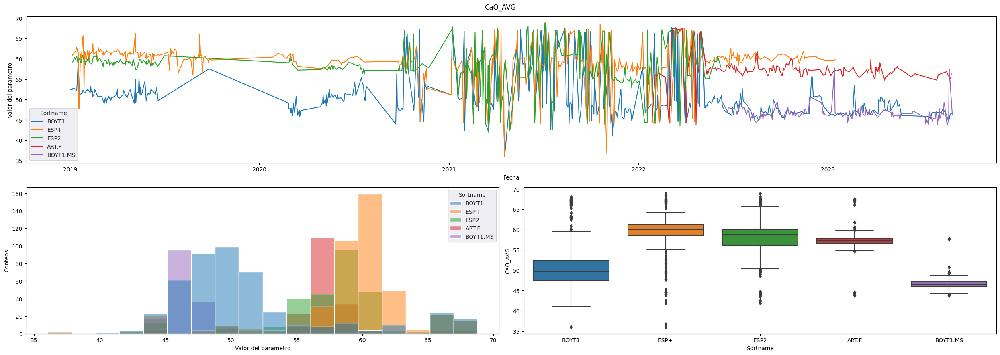

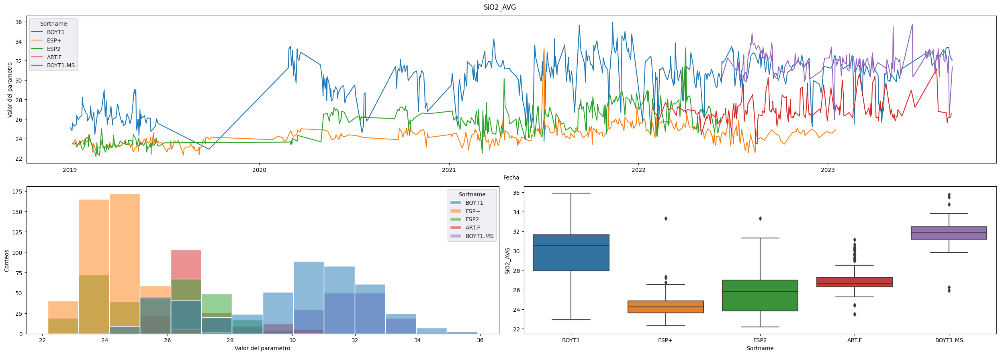

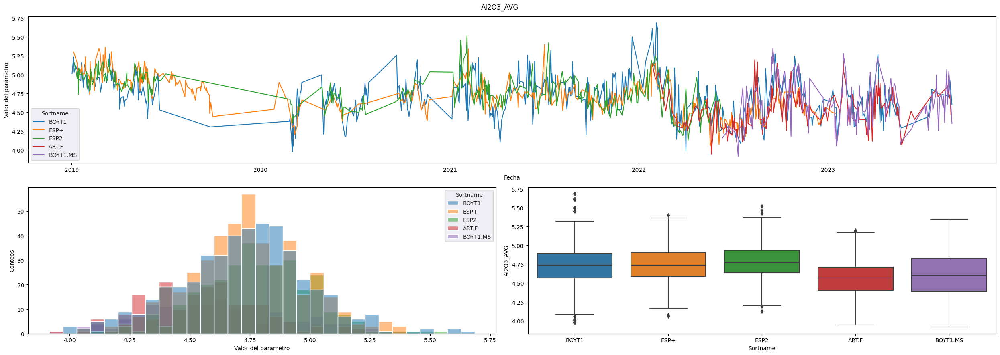

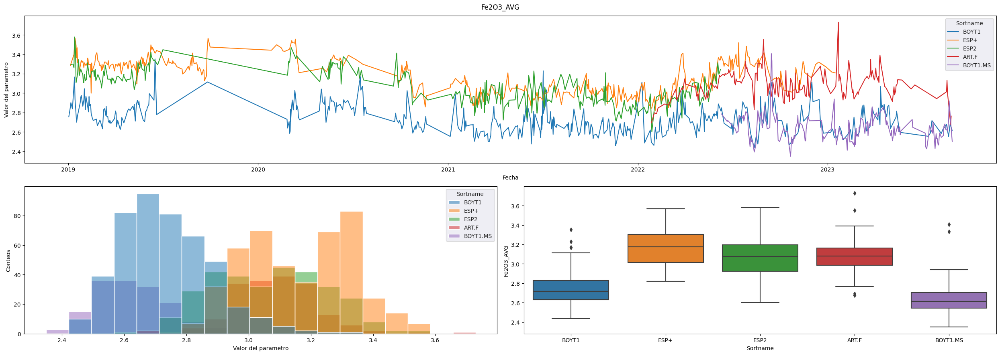

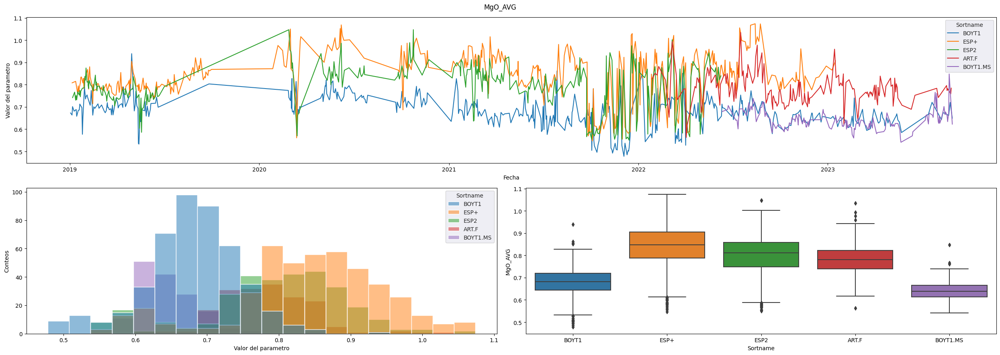

...

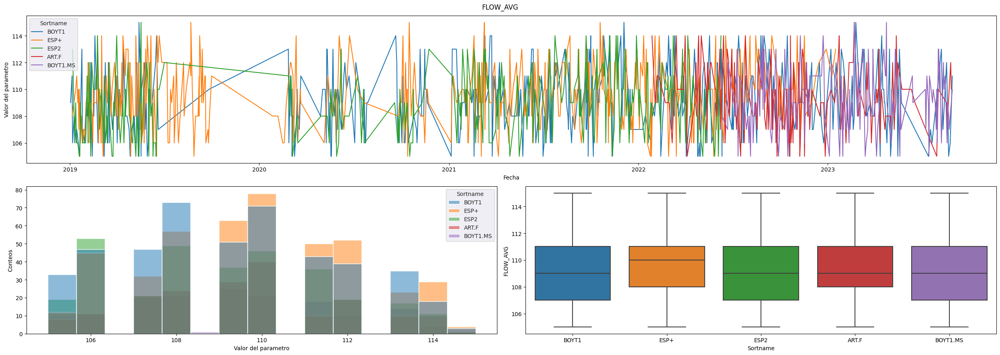

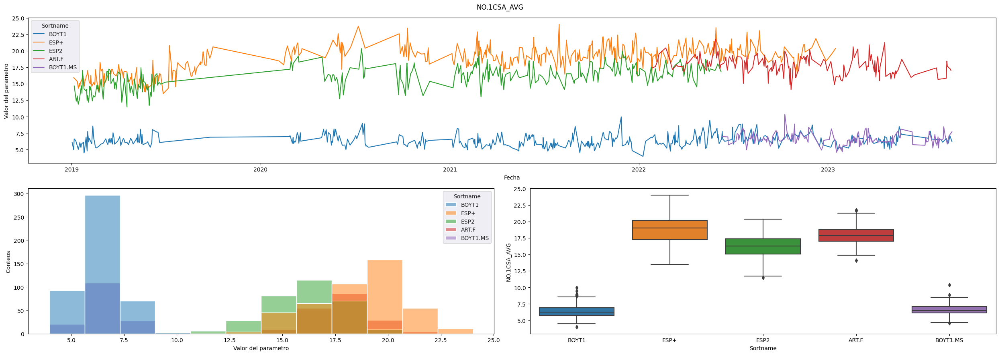

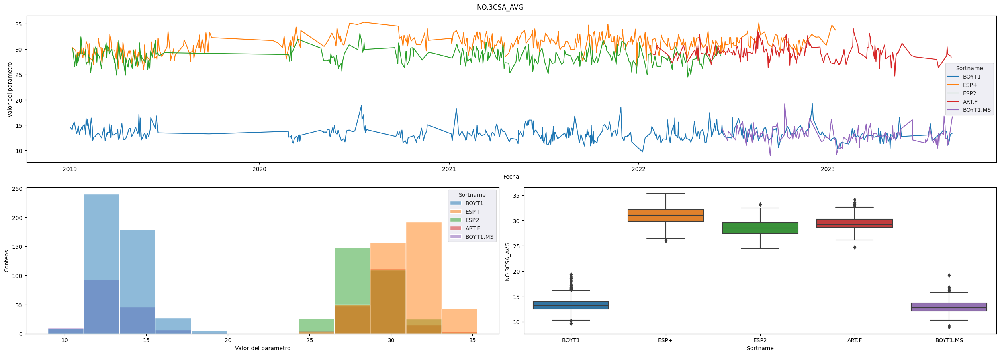

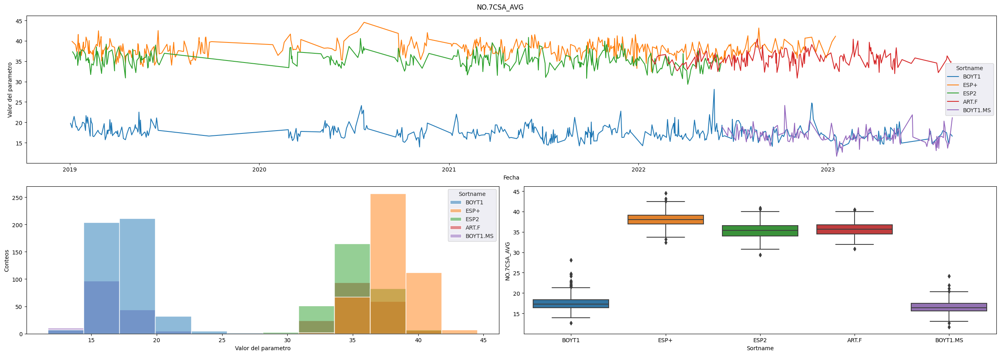

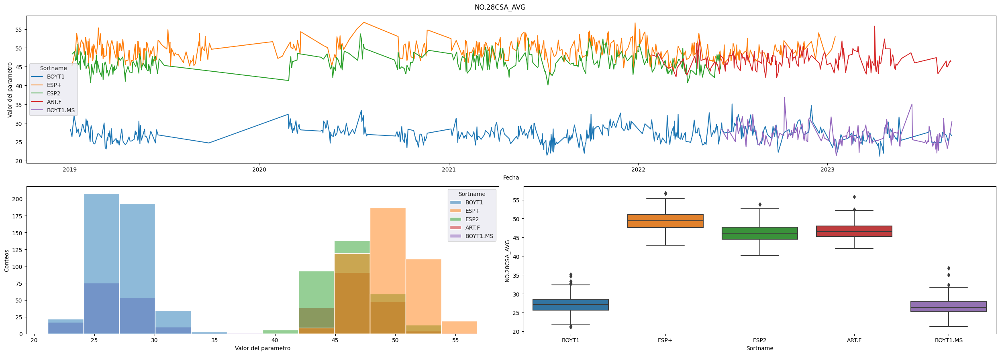

In [9]:
plt.rcParams['figure.max_open_warning'] = len(df.columns[3:])

for var in features:
    rev_var(df, var)

# Separación de dtaframes

In [10]:
resistencias = {
    'NO.1CSA_AVG': 'R1' ,
    'NO.3CSA_AVG' : 'R3',
    'NO.7CSA_AVG' : 'R7',
    'NO.28CSA_AVG' : 'R28'
}

df = df.rename(columns = resistencias)
df.columns

Index(['Start Time', 'Sortname', 'Location', 'CaO_AVG', 'SiO2_AVG',
       'Al2O3_AVG', 'Fe2O3_AVG', 'MgO_AVG', 'NO.SO3.P_AVG', 'LOI.P_AVG',
       'Na2O.P_AVG', 'K2O.P_AVG', 'TiO2_AVG', 'P2O5_AVG', 'Mn2O3_AVG',
       'Cl_AVG', 'Cr2O3_AVG', 'NO.R45_AVG', 'WC_AVG', 'WR_AVG', 'SETINI_AVG',
       'SETFIN_AVG', 'FLOW_AVG', 'R1', 'R3', 'R7', 'R28'],
      dtype='object')

In [11]:
df.head(5)

,Start Time,Sortname,Location,CaO_AVG,SiO2_AVG,Al2O3_AVG,Fe2O3_AVG,MgO_AVG,NO.SO3.P_AVG,LOI.P_AVG,Na2O.P_AVG,K2O.P_AVG,TiO2_AVG,P2O5_AVG,Mn2O3_AVG,Cl_AVG,Cr2O3_AVG,NO.R45_AVG,WC_AVG,WR_AVG,SETINI_AVG,SETFIN_AVG,FLOW_AVG,R1,R3,R7,R28
33,2019-01-02,BOYT1,NO.630.d,52.406399,25.0984,5.0146,2.7556,0.6735,2.3595,9.72,0.0762,0.8142,0.2942,0.3372,0.0514,0.0193,0.0081,12.33,52.029999,24.92,181,260,109.0,6.1,14.52,19.780001,28.309999
171,2019-01-05,BOYT1,NO.563.d,52.431499,24.811501,5.233,2.8548,0.6637,2.3451,9.71,0.1162,0.868,0.2913,0.3468,0.0539,0.019,0.007,11.86,51.889999,24.77,177,270,111.0,4.96,14.04,18.67,26.33
174,2019-01-05,ESP+,NO.630.d,60.783199,23.4116,5.3005,3.2836,0.8082,2.6497,1.96,0.09,0.825,0.2964,0.3807,0.0595,0.0181,0.0056,1.16,48.919998,24.92,128,175,108.0,15.92,30.33,39.880001,45.209999
231,2019-01-06,BOYT1,NO.563.d,52.664001,25.6136,5.0334,2.9018,0.7016,2.3768,9.33,0.0663,0.8857,0.2957,0.336,0.0524,0.0208,0.0084,12.43,52.029999,24.15,159,252,106.0,6.61,14.78,19.879999,28.18
234,2019-01-06,ESP2,NO.563.d,59.214901,23.465599,5.1661,3.2947,0.7415,2.3205,4.0,0.0776,0.8463,0.2909,0.3823,0.0579,0.019,0.0091,1.01,48.650002,25.690001,128,201,113.0,14.67,30.15,37.330002,48.389999


In [12]:
categoricas = ['Start Time', 'Sortname', 'Location']

var_quimicas = [ 'CaO_AVG', 
                 'SiO2_AVG', 
                 'Al2O3_AVG', 
                 'Fe2O3_AVG', 
                 'MgO_AVG', 
                 'NO.SO3.P_AVG',                                      
                 'Na2O.P_AVG', 
                 'K2O.P_AVG', 
                 'TiO2_AVG', 
                 'P2O5_AVG', 
                 'Mn2O3_AVG',
                 'Cl_AVG', 
                 'Cr2O3_AVG'
              ]

var_fisicas = [ 
                'LOI.P_AVG',                   
                'NO.R45_AVG', 
                'WC_AVG',  
                'WR_AVG', 
                'SETINI_AVG',
                'SETFIN_AVG', 
                'FLOW_AVG'
               ]

resistencias = ['R1',
                'R3',
                'R7',
                'R28'
               ]

df_R1 = df[ categoricas + var_quimicas + var_fisicas + resistencias[:1]]
df_R3 = df[ categoricas + var_quimicas + var_fisicas + resistencias[:2]]
df_R7 = df[ categoricas + var_quimicas + var_fisicas + resistencias[:3]]
df_R28 = df[ categoricas + var_quimicas + var_fisicas + resistencias[:4]]

# Exploración - vista de correlaciones

<Axes: >

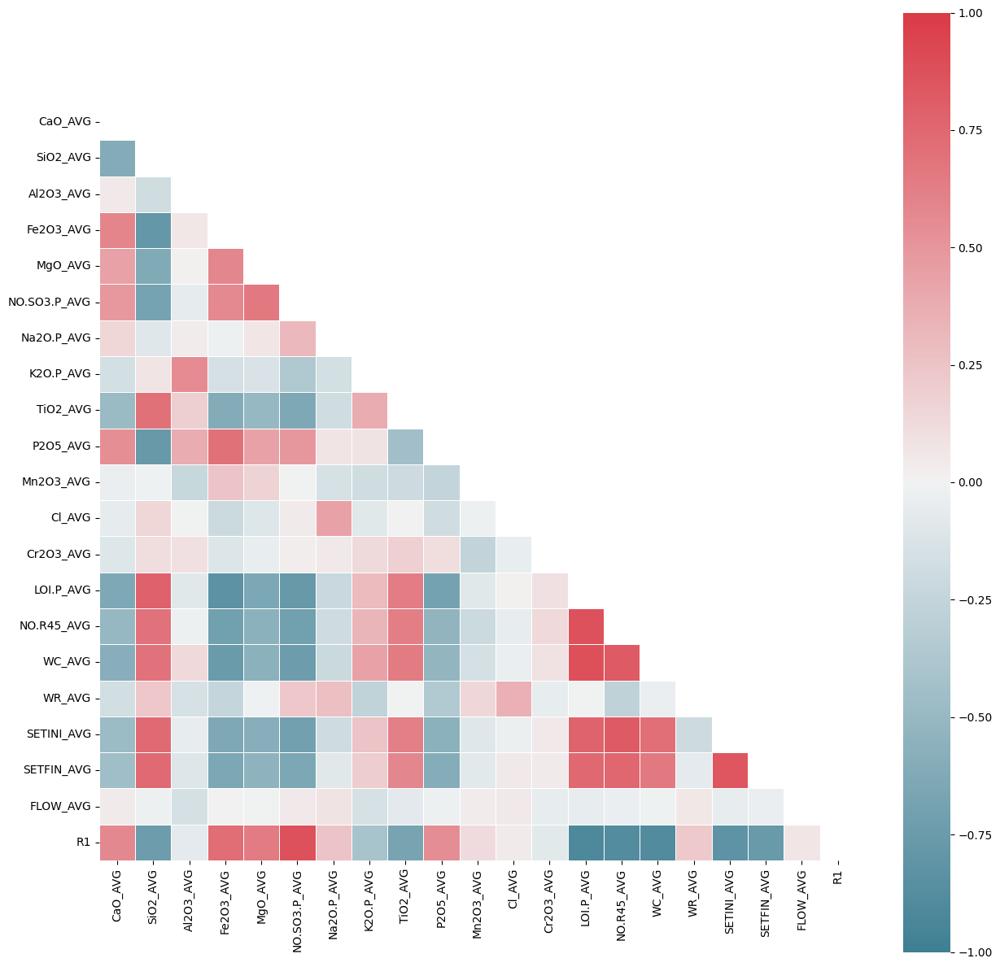

In [13]:
plot_correlation(df_R1)

In [14]:
list_corr(df_R1, 'R1', 15)

LOI.P_AVG       0.908940
WC_AVG          0.897910
NO.R45_AVG      0.889505
NO.SO3.P_AVG    0.868760
SETINI_AVG      0.823424
SETFIN_AVG      0.761860
SiO2_AVG        0.741135
Fe2O3_AVG       0.722078
TiO2_AVG        0.678238
MgO_AVG         0.647551
CaO_AVG         0.571648
P2O5_AVG        0.545694
K2O.P_AVG       0.409785
Na2O.P_AVG      0.254941
Name: R1, dtype: float64

<Axes: >

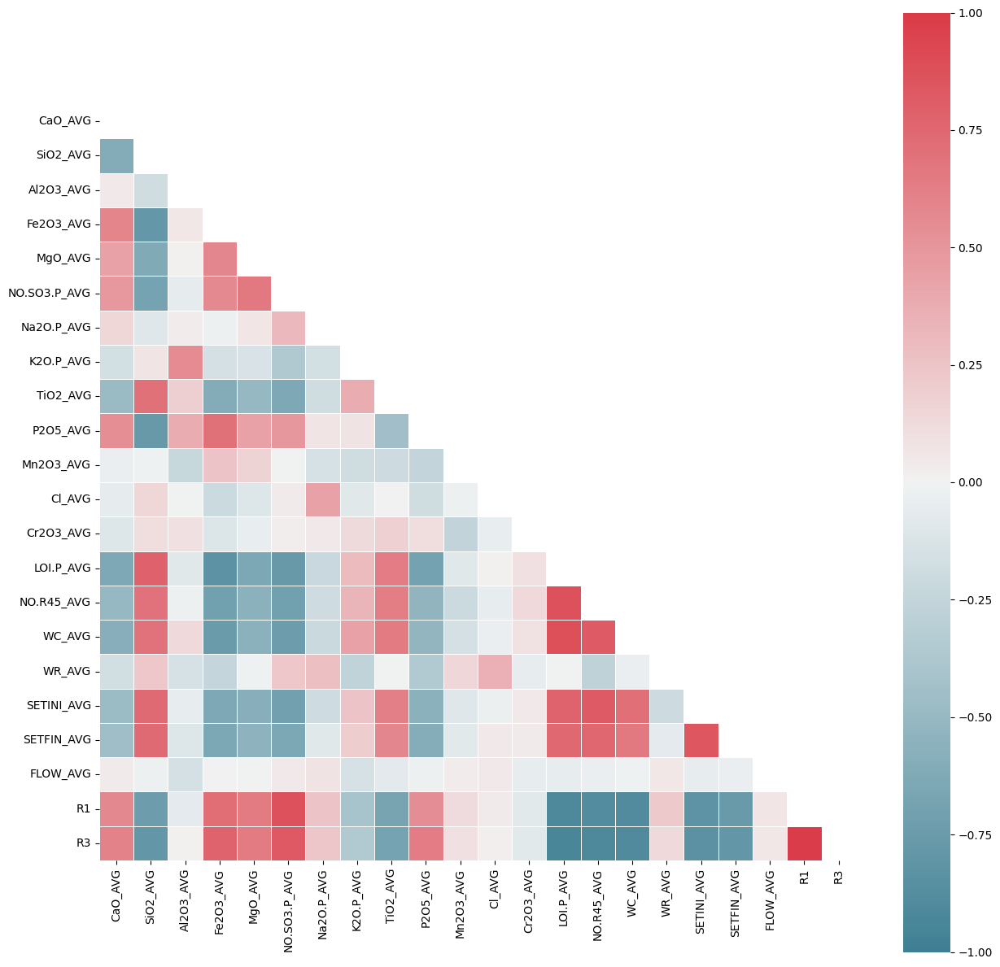

In [15]:
plot_correlation(df_R3)

In [16]:
list_corr(df_R3, 'R3', 15)

R1              0.976636
LOI.P_AVG       0.944370
NO.R45_AVG      0.913893
WC_AVG          0.904074
SETINI_AVG      0.836843
NO.SO3.P_AVG    0.832453
SiO2_AVG        0.796676
SETFIN_AVG      0.789587
Fe2O3_AVG       0.774907
TiO2_AVG        0.683391
MgO_AVG         0.648071
P2O5_AVG        0.637359
CaO_AVG         0.604759
K2O.P_AVG       0.352411
Name: R3, dtype: float64

<Axes: >

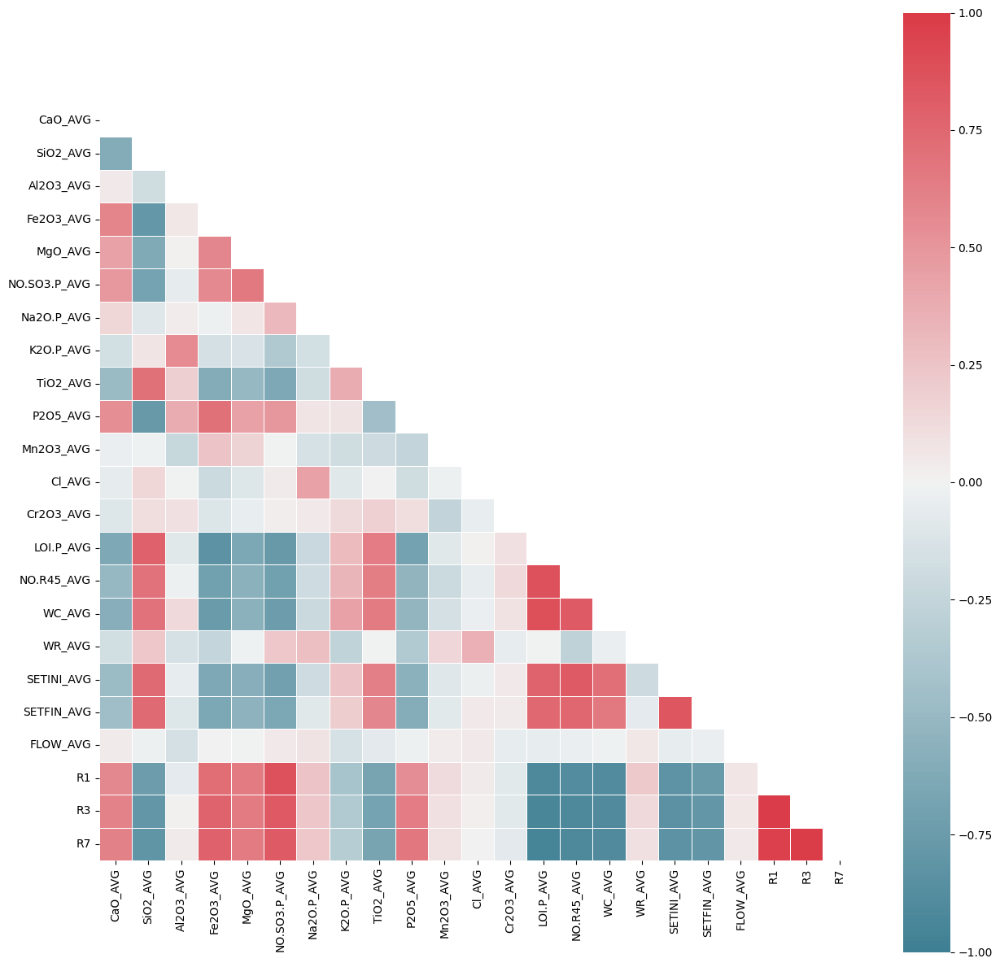

In [17]:
plot_correlation(df_R7)

In [18]:
list_corr(df_R7, 'R7', 15)

R3              0.989992
R1              0.962282
LOI.P_AVG       0.953458
NO.R45_AVG      0.912783
WC_AVG          0.901240
SETINI_AVG      0.833070
NO.SO3.P_AVG    0.813540
SiO2_AVG        0.811833
SETFIN_AVG      0.799603
Fe2O3_AVG       0.788557
TiO2_AVG        0.676843
P2O5_AVG        0.669080
MgO_AVG         0.645002
CaO_AVG         0.612248
Name: R7, dtype: float64

<Axes: >

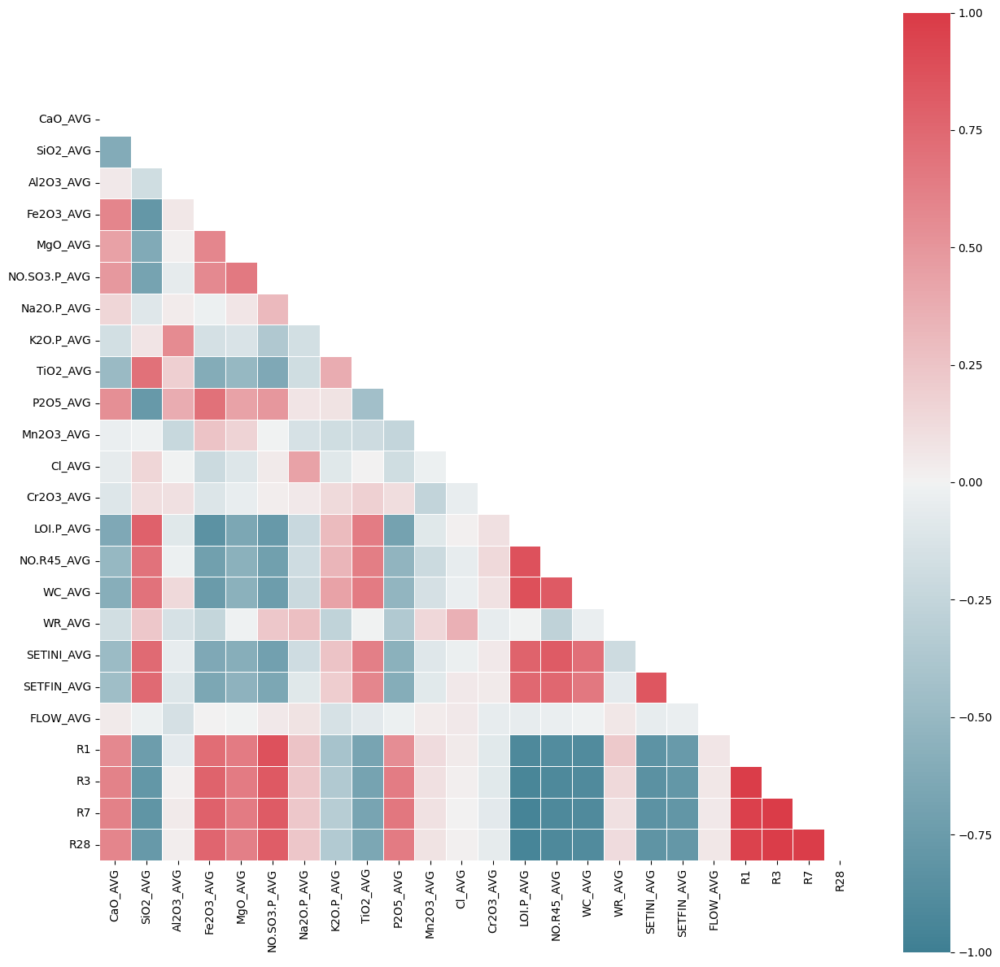

In [19]:
plot_correlation(df_R28)

In [20]:
list_corr(df_R28, 'R28', 15)

R7              0.983337
R3              0.980096
R1              0.954682
LOI.P_AVG       0.948578
NO.R45_AVG      0.913158
WC_AVG          0.896645
SETINI_AVG      0.819797
NO.SO3.P_AVG    0.809904
SETFIN_AVG      0.784584
SiO2_AVG        0.771478
Fe2O3_AVG       0.763561
TiO2_AVG        0.655205
P2O5_AVG        0.643960
MgO_AVG         0.624923
Name: R28, dtype: float64